## __Importing Data__
### __Looking at the data set__
When looking at the data set there are a few key aspect that stand out within the data set. There are individual characteristic variables
(ie. Marital status, Sex, Education, Age), and then there are banking infomation variables (limit balance, months delayed, bill amount, payment amounts). In order to work with this data we use a number of python libraries (numpy, and pandas for dataframe manipulation. matplot lib and seaborn for data visulaiztion. sklearn for the modeling and cross validation. statsmodel for getting tables).

In [64]:
#importing libs

#Data management
import pandas as pd 
import numpy as np

#data visualization
import matplotlib.pyplot as plt
import seaborn as sns

#t-stastistic
from scipy.stats import ttest_ind

#ols modeling
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression

#logit modeling
from statsmodels.api import qqplot
from statsmodels.formula.api import logit
from sklearn.metrics import brier_score_loss
from sklearn.linear_model import LogisticRegression
from statsmodels.discrete.discrete_model import Logit 

#model validation
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score, KFold

#threshold finding & classification report
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

#possible utility tools
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

#random forest modeling
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error as MSE

In [65]:
#creating the new dataframe
df = pd.read_csv(r"C:\Users\Brand\OneDrive\Documents\Csv Data\Credit data.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

# __Data Management__
### __Part 1: Standardizing variables__
During preprocessing, we encountered several issues with the original data formatting that required careful re-coding to ensure consistency and interpretability:

 - Marital Status: The original marital status variable was non-binary with multiple categories. For analysis purposes, we recoded it into a binary format: individuals were classified as either married (1) or not married (0).

 - Education Level: The education variable ranged from 1 to 6, which made direct interpretation difficult. To simplify the analysis, we redefined this variable as college-educated (1) versus non–college-educated (0).

 - PAY_# Variables: The payment status variables (PAY_0, PAY_2, ..., PAY_6) contained values of -2 and -1, which indicated full or partial repayment. To treat these variables as consistent, discrete numerical measures of delay, we recoded both -2 and -1 to 0, representing no delay. The resulting PAY_# variables now reflect months of delayed payment, with 0 meaning on-time payment and positive integers indicating the number of months overdue

In [66]:
#editing the descriptive variables
df = df.rename(columns={'default payment next month': 'default_payment_next_month'})
# marriage 1 = married 0 = not married
df['MARRIAGE'] = df['MARRIAGE'].replace(2, 0)
df['MARRIAGE'] = df['MARRIAGE'].replace(3, 0)
# education 1 = college educated 0 = high school
df['EDUCATION'] = df['EDUCATION'].replace(2, 1)
df['EDUCATION'] = df['EDUCATION'].replace(3, 0)
df['EDUCATION'] = df['EDUCATION'].replace(4, 0)
df['EDUCATION'] = df['EDUCATION'].replace(5, 0)
df['EDUCATION'] = df['EDUCATION'].replace(6, 0)
#payment variables 1-6 modifications changing -2 and -1 to 0
df["PAY_0"] = df['PAY_0'].replace(-2, 0)
df["PAY_0"] = df['PAY_0'].replace(-1, 0)
df["PAY_2"] = df['PAY_2'].replace(-2, 0)
df["PAY_2"] = df['PAY_2'].replace(-1, 0)
df["PAY_3"] = df['PAY_3'].replace(-2, 0)
df["PAY_3"] = df['PAY_3'].replace(-1, 0)
df["PAY_4"] = df['PAY_4'].replace(-2, 0)
df["PAY_4"] = df['PAY_4'].replace(-1, 0)
df["PAY_5"] = df['PAY_5'].replace(-2, 0)
df["PAY_5"] = df['PAY_5'].replace(-1, 0)
df["PAY_6"] = df['PAY_6'].replace(-2, 0)
df["PAY_6"] = df['PAY_6'].replace(-1, 0)
df['SEX'] = df['SEX'].replace(1, 0)
df['SEX'] = df['SEX'].replace(2, 1)
print(df['EDUCATION'].value_counts(normalize=True),'\n', df['MARRIAGE'].value_counts(normalize=True),'\n', df['PAY_0'].value_counts(normalize=True))

EDUCATION
1    0.8205
0    0.1795
Name: proportion, dtype: float64 
 MARRIAGE
0    0.5447
1    0.4553
Name: proportion, dtype: float64 
 PAY_0
0    0.772733
1    0.122933
2    0.088900
3    0.010733
4    0.002533
5    0.000867
8    0.000633
6    0.000367
7    0.000300
Name: proportion, dtype: float64


## __part 2: Feature Engineering & Multicollinearity Handling__
The goal of this step is to turn a cluster of highly correlated, month-by-month credit-card fields into a smaller set of informative, low-redundancy predictors that play nicely with logistic-regression (and other) models.
| Transformation                                                  | Rationale                                                                                                                                                                                                                                     |
| --------------------------------------------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Averaged balances & payments (`avg_balance`, `avg_payment`)** | Six monthly columns (`BILL_AMT1‒6`, `PAY_AMT1‒6`) are almost perfectly correlated with each other. Collapsing them to their mean reduces dimensionality, mitigates multicollinearity, and produces a *single* signal of typical behaviour.    |
| **Average delay (`avg_delay`)**                                 | Likewise, `PAY_0, PAY_2‒6` are collinear snapshots of delinquency. Their mean yields one interpretable “months-behind” metric.                                                                                                                |
| **Log transforms (`log_avgbalance`, `log_avgpayment`)**         | Balances and payments are right-skewed and span several orders of magnitude. Logging (with a tiny offset to preserve zeros) stabilises variance, pulls in extreme tails, and improves linearity with the log-odds in logistic models.         |
| **Dispersion features (`sd_*`, `cv_*`)**                        | Two customers with the same mean can behave very differently month-to-month. The **standard deviation** and **coefficient of variation** quantify volatility in balances and payments—information that pure averages would miss.              |
| **Utilisation & repayment ratios (`usage`, `pay_bal_ratio`)**   | Ratios capture *behavioural intensity* independent of absolute credit limits:  <br>• `usage` ≈ credit-utilisation rate, an industry-standard risk marker.  <br>• `pay_bal_ratio` signals how aggressively a customer pays down what they owe. |
| **Scaling by 1000**                                             | Dividing large monetary figures by 1 000 keeps coefficients numerically  interpretable (e.g., “per ¥1 000” rather than “per ¥1”).                                                                                                   |


In [67]:
#Creating a variable that averages the bill balences and the amount paid
df['avg_balance'] = df[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3','BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].mean(axis=1)/1000
df['avg_payment'] = df[['PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3','PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']].mean(axis=1)/1000
df['avg_delay'] = df[['PAY_0', 'PAY_2', 'PAY_3','PAY_4', 'PAY_5', 'PAY_6']].mean(axis=1)
df['log_avgbalance'] = np.log(df['avg_balance'].clip(lower=0.00001))
df['log_avgpayment'] = np.log(df['avg_payment'] + .00001)
#creating coefficents of variations for the three 
df['sd_balance'] = df[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3','BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].std(axis=1)/1000
df['sd_payment'] = df[['PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3','PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']].std(axis=1)/1000
#coefficent of variation 
df['cv_payment'] = df['sd_payment'] / (df['avg_payment'] + .000001)
df['cv_balance'] = df['sd_balance'] / (df['avg_balance'] + .000001)
#creating a credit usage varaible
df['usage'] = df['avg_balance']/(df['LIMIT_BAL']/1000)
df['pay_bal_ratio'] = df['avg_payment']/(df['avg_balance'] + .000001) 


# __Summary Statistics__
### __part 1: Describing the poplation statistics__
 we can draw several foundational insights into borrower behavior. Most individuals have credit limits ranging from 50,000 to 240,000, reflecting a broad but right-skewed distribution of credit access. The median age is 34, with the majority of borrowers being married and having completed at least a bachelors degree for education. When evaluating repayment behavior, the median delay is 0, meaning that at least half of the population pays on time each month, despite the mean being slightly elevated due to a smaller group of chronically late payers. Average balances and payments fall within a moderate IQR range, indicating stable financial behavior among most users.

In [68]:
#exploring and analysising my data
df[['LIMIT_BAL','SEX','EDUCATION','MARRIAGE','AGE','avg_balance', 'avg_payment', 'avg_delay']].describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,avg_balance,avg_payment,avg_delay
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,167484.322667,0.603733,0.820500,0.455300,35.485500,44.976945,5.275232,0.281283
std,129747.661567,0.489129,0.383777,0.498006,9.217904,63.260722,10.137946,0.601554
min,10000.000000,0.000000,0.000000,0.000000,21.000000,-56.043167,0.000000,0.000000
25%,50000.000000,0.000000,1.000000,0.000000,28.000000,4.781333,1.113292,0.000000
50%,140000.000000,1.000000,1.000000,0.000000,34.000000,21.051833,2.397167,0.000000
75%,240000.000000,1.000000,1.000000,1.000000,41.000000,57.104417,5.583917,0.333333
max,1000000.000000,1.000000,1.000000,1.000000,79.000000,877.313833,627.344333,6.000000


In [69]:
df[['usage','pay_bal_ratio','cv_balance', 'cv_payment']].describe()

,usage,pay_bal_ratio,cv_balance,cv_payment
count,30000.000000,3.000000e+04,30000.000000,30000.000000
mean,0.373048,3.444220e+03,62.452611,0.901776
std,0.351890,2.092922e+05,6402.616904,0.655537
min,-0.232590,-5.471631e+02,-922.738594,0.000000
25%,0.029997,4.107343e-02,0.079917,0.380068
50%,0.284834,8.619251e-02,0.351978,0.788798
75%,0.687929,5.982573e-01,0.838107,1.299260
max,5.364308,2.700000e+07,894427.191000,2.449490


### __part 2: Comparing the defaulter to the non defaulters__
we grouped the population by the default_payment_next_month variable and compared key demographic and financial features. Notably, defaulters tend to have significantly lower credit limits (mean ≈ 130,110) compared to non-defaulters (mean ≈ 178,100), suggesting that lending institutions may preemptively limit exposure to higher-risk individuals. The average delay for defaulters is markedly higher (mean = 0.71 months) versus just 0.16 for non-defaulters, highlighting chronic lateness as a strong indicator of default risk. Financial behavior also diverges: defaulters have higher credit utilization (mean usage = 0.45 vs. 0.35) and slightly more volatile payments, as seen in the elevated coefficient of variation in both balance and payment metrics. These patterns suggest that higher usage, lower limits, and persistent delays are key behavioral traits associated with elevated credit risk.

In [70]:
#comparing the default group to the non default group
df.groupby('default_payment_next_month')[['LIMIT_BAL','SEX','EDUCATION','MARRIAGE','AGE', 'avg_delay']].agg(['mean', 'std', 'count'])

LIMIT_BAL                             SEX  \
                                     mean            std  count      mean   
default_payment_next_month                                                  
0                           178099.726074  131628.359660  23364  0.614150   
1                           130109.656420  115378.540571   6636  0.567058   

                                            EDUCATION                   \
                                 std  count      mean       std  count   
default_payment_next_month                                               
0                           0.486806  23364  0.823874  0.380935  23364   
1                           0.495520   6636  0.808620  0.393417   6636   

                            MARRIAGE                         AGE            \
                                mean       std  count       mean       std   
default_payment_next_month                                                   
0                           0.447398  0.497236  23364  35.417266  9.077355   
1                           0.483122  0.499753   6636  35.725738  9.693438   

                                  avg_delay                   
                            count      mean       std  count  
default_payment_next_month                                    
0                           23364  0.160732  0.421656  23364  
1                            6636  0.705721  0.882455   6636

In [71]:
#comparing the default group to the non default group
df.groupby('default_payment_next_month')[['usage','pay_bal_ratio','cv_balance', 'cv_payment',  'avg_payment', 'avg_balance']].agg(['mean', 'std', 'count'])

usage                  pay_bal_ratio  \
                                mean       std  count          mean   
default_payment_next_month                                            
0                           0.351391  0.343741  23364   4205.180893   
1                           0.449298  0.369243   6636    765.031314   

                                                 cv_balance               \
                                      std  count       mean          std   
default_payment_next_month                                                 
0                           236835.291137  23364  80.084598  7255.056005   
1                            23092.782934   6636   0.373990     5.372158   

                                  cv_payment                  avg_payment  \
                            count       mean       std  count        mean   
default_payment_next_month                                                  
0                           23364   0.898131  0.658492  23364    5.828237   
1                            6636   0.914613  0.644909   6636    3.328216   

                                             avg_balance                    
                                  std  count        mean        std  count  
default_payment_next_month                                                  
0                           10.947044  23364   45.404818  62.958655  23364  
1                            6.152605   6636   43.470493  64.295089   6636

### __part 3: data visualizations__

Text(0.5, 1.0, 'Correlation Matrix of Banking Variables')

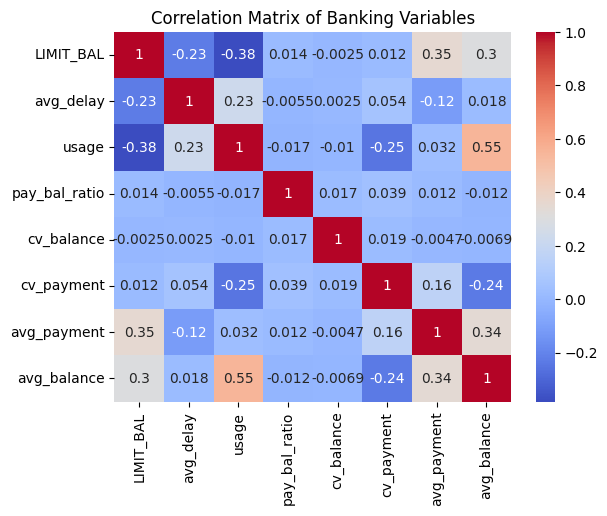

In [72]:
#correlation map
sns.heatmap(df[['LIMIT_BAL', 'avg_delay','usage','pay_bal_ratio','cv_balance', 'cv_payment',  'avg_payment', 'avg_balance']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Banking Variables')

Text(0.5, 1.0, 'Correlation Matrix of Bill Variables')

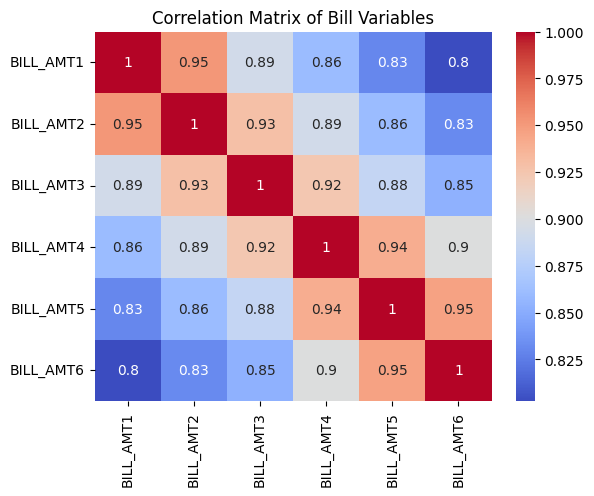

In [128]:
sns.heatmap(df[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3','BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Bill Variables')

Text(0.5, 1.0, 'Correlation Matrix of pay Variables')

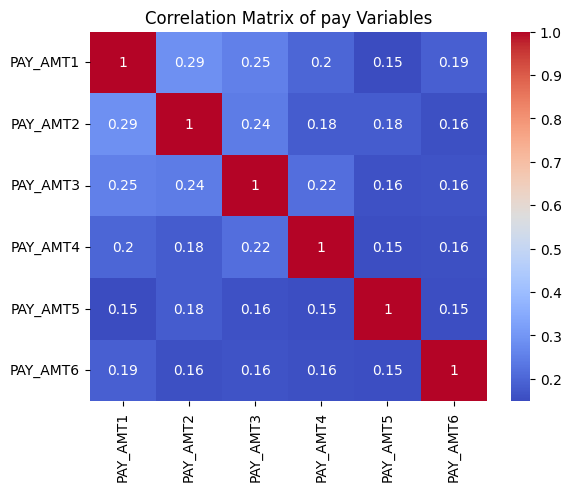

In [129]:
sns.heatmap(df[['PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3','PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of pay Variables')

Text(0.5, 1.0, 'Correlation Matrix of pay Variables')

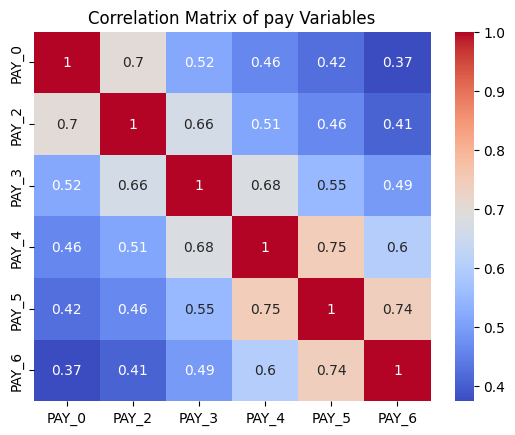

In [130]:
sns.heatmap(df[['PAY_0', 'PAY_2', 'PAY_3','PAY_4', 'PAY_5', 'PAY_6']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of pay Variables')

In [73]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
X = df[['SEX' , 'EDUCATION' ,'MARRIAGE' ,'AGE' , 'avg_delay' , 'usage' ,'log_avgbalance' , 'log_avgpayment' , 'cv_payment' ,'cv_balance', 'pay_bal_ratio']]  # or more
X = sm.add_constant(X)
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["variable"] = X.columns
print(vif)

          VIF        variable
0   37.554729           const
1    1.023111             SEX
2    1.067067       EDUCATION
3    1.264073        MARRIAGE
4    1.328303             AGE
5    1.208433       avg_delay
6    1.644641           usage
7    3.453934  log_avgbalance
8    3.119968  log_avgpayment
9    1.349798      cv_payment
10   1.004205      cv_balance
11   1.016592   pay_bal_ratio


Text(0.5, 1.0, 'Usage Distribution by Default Status')

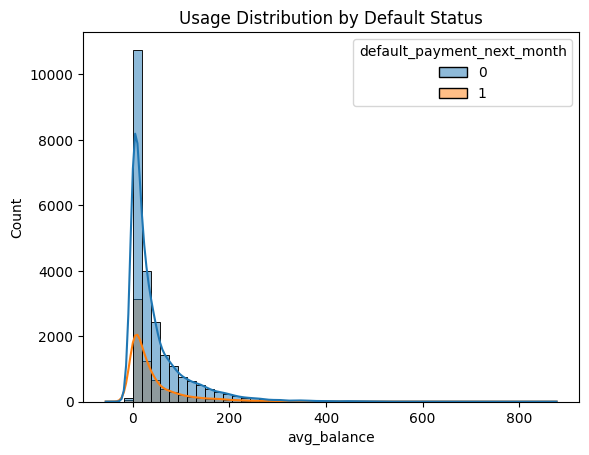

In [74]:
#histogram showing usage amount defaulters and non defaulters
sns.histplot(data=df, x='avg_balance', hue='default_payment_next_month', kde=True, bins=50)
plt.title('Usage Distribution by Default Status')

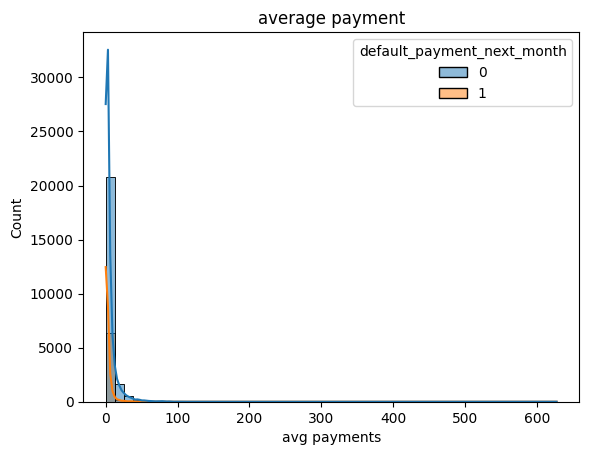

In [75]:
sns.histplot(data=df, x='avg_payment', hue='default_payment_next_month', kde=True, bins=50)
plt.title('average payment')
plt.xlabel('avg payments')
plt.show()


# __OLS Models__
## __Model 1__
### Model 1 Summary – Baseline OLS Regression
Model 1 serves as a **baseline specification**, using only basic demographic and borrower characteristic data to estimate the likelihood of default. The predictors include `SEX`, `EDUCATION`, `MARRIAGE`, and `AGE`.
The general OLS regression equation is:

$$
\hat{y} = \beta_0 - \beta_1 \cdot \text{SEX} + \beta_2 \cdot \text{EDUCATION} + \beta_3 \cdot \text{MARRIAGE} - \beta_4 \cdot \text{AGE}
$$

**Where:**

| Term                 | Description                                                                 |
| -------------------- | --------------------------------------------------------------------------- |
| ŷ                    | Predicted probability of default                                            |
| β₀ to β₆             | Estimated regression coefficients                                           |
| SEX, EDUCATION, etc. | Dummy-coded categorical predictors (e.g., `SEX = 1` for male, 0 for female) |
| AGE                  | Continuous numeric variable                                                 |

Despite being statistically significant overall (F-statistic = 20.85, p < 0.001), the model explains only a small fraction of the variance in default status (R² = 0.003), indicating weak predictive power. Among the predictors, SEX, EDUCATION, and MARRIAGE are statistically significant at the 5% level, with SEX showing that males are slightly less likely to default. AGE is not statistically significant, suggesting it does not have a linear relationship with default in this context. Overall, this baseline model demonstrates that demographic characteristics alone offer limited explanatory power for predicting credit default.



In [76]:
#model 1 summary
ols1_overview = ols('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE', data = df).fit()
print(ols1_overview.summary())

                                OLS Regression Results                                
Dep. Variable:     default_payment_next_month   R-squared:                       0.003
Model:                                    OLS   Adj. R-squared:                  0.003
Method:                         Least Squares   F-statistic:                     20.85
Date:                        Mon, 04 Aug 2025   Prob (F-statistic):           3.48e-17
Time:                                14:37:43   Log-Likelihood:                -16146.
No. Observations:                       30000   AIC:                         3.230e+04
Df Residuals:                           29995   BIC:                         3.234e+04
Df Model:                                   4                                         
Covariance Type:                    nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

## Model 2 
### Model 2 Summary – Financial varaibles
Model 2 enhances the baseline specification by introducing log-transformed financial variables—log_avgbalance and log_avgpayment.Additionally, the inclusion of the payment-to-balance ratio (pay_bal_ratio) offers insight into borrower behavior by measuring the proportion of their outstanding balance that is repaid. This ratio helps distinguish between individuals who revolve high balances and those who consistently pay down debt, providing a meaningful behavioral signal associated with credit risk

$$
\hat{y} = \beta_0 + \beta_1 \cdot \text{SEX} + \beta_2 \cdot \text{EDUCATION} + \beta_3 \cdot \text{MARRIAGE} + \beta_4 \cdot \text{AGE} + \beta_5 \cdot \log(\text{avgbalance}) + \beta_6 \cdot \log(\text{avgpayment}) + \beta_7 \cdot \text{pay\_bal\_ratio}
$$

**Where:**

| Term                 | Description                                                                 |
| -------------------- | --------------------------------------------------------------------------- |
| ŷ                    | Predicted probability of default                                            |
| β₀ to β₆             | Estimated regression coefficients                                           |
| SEX, EDUCATION, etc. | Dummy-coded categorical predictors (e.g., `SEX = 1` for male, 0 for female) |
| AGE                  | Discrete numeric variable                                                   |
| log(avgbalance)      | Log-transformed average bill balance (in thousands)                         |
| log(avgpayment)      | Log-transformed average payment amount (in thousands)                       |
| pay\_bal\_ratio      | Ratio of average payments to average balance across 6 months; represents repayment behavior   |

Model 2 significantly improves upon Model 1 by incorporating key financial behavior variables—log_avgbalance, log_avgpayment, and pay_bal_ratio. While Model 1 relied solely on static borrower characteristics (SEX, EDUCATION, MARRIAGE, AGE) and achieved a low R-squared of 0.003, Model 2 raises this to 0.026, marking a meaningful increase in explanatory power.

- log_avgbalance: has a positive and significant effect, suggesting that individuals with higher average balances are more likely to default.

- log_avgpayment: shows a strong negative and significant relationship with default risk, implying that larger historical payments are associated with reduced likelihood of default.

- pay_bal_ratio: while theoretically capturing repayment efficiency, is statistically insignificant—likely because its signal is already absorbed by the two log-transformed components.

The improvement in R² reflects the importance of integrating behavioral financial metrics. However, the insignificance of pay_bal_ratio and the elevated condition number suggest some mild multicollinearity concerns, justifying its removal in subsequent models. Overall, Model 2 enhances the model’s predictive insight while revealing the limited marginal value of the added ratio.




In [77]:
ols2_overview = ols('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE + log_avgbalance + log_avgpayment + pay_bal_ratio', data = df).fit()
print(ols2_overview.summary())

                                OLS Regression Results                                
Dep. Variable:     default_payment_next_month   R-squared:                       0.026
Model:                                    OLS   Adj. R-squared:                  0.026
Method:                         Least Squares   F-statistic:                     114.8
Date:                        Mon, 04 Aug 2025   Prob (F-statistic):          4.99e-167
Time:                                14:37:43   Log-Likelihood:                -15791.
No. Observations:                       30000   AIC:                         3.160e+04
Df Residuals:                           29992   BIC:                         3.166e+04
Df Model:                                   7                                         
Covariance Type:                    nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

## Model 3
### Model 3 Summary – Payment delay metrics

Model 3 builds on Model 2 by introducing avg_delay, a behavioral indicator reflecting the borrower’s average payment timeliness across six months. 

$$
\hat{y} = \beta_0 
+ \beta_1 \cdot \text{SEX} 
+ \beta_2 \cdot \text{EDUCATION} 
+ \beta_3 \cdot \text{MARRIAGE} 
+ \beta_4 \cdot \text{AGE} 
+ \beta_5 \cdot \log(\text{avgbalance}) 
+ \beta_6 \cdot \log(\text{avgpayment}) 
+ \beta_7 \cdot \text{avg\_delay} 
$$

**Where:**

| Term                 | Description                                                                 |
| -------------------- | --------------------------------------------------------------------------- |
| ŷ                    | Predicted probability of default                                            |
| β₀ to β₆             | Estimated regression coefficients                                           |
| SEX, EDUCATION, etc. | Dummy-coded categorical predictors (e.g., `SEX = 1` for male, 0 for female) |
| AGE                  | Discrete numeric variable                                                   |
| log(avgbalance)      | Log-transformed average bill balance (in thousands)                         |
| log(avgpayment)      | Log-transformed average payment amount (in thousands)                       |
| avg_delay            | This variable is a contiunous numerical variable and represents avgerage delay of payment in the 6 month period                                           |

Model 3 significantly improves upon the previous specifications by introducing the behavioral variable avg_delay, which measures the average months of delayed payment. Its inclusion leads to a notable increase in explanatory power, raising the R-squared from 0.026 in Model 2 to 0.151. Among all predictors, avg_delay is the strongest, with a large positive and highly significant coefficient, indicating that longer delays are strongly associated with higher default risk. Financial variables like log_avgbalance and log_avgpayment remain significant and negative, suggesting that higher balances and payments reduce default likelihood. Demographic factors such as SEX and MARRIAGE also maintain significance, though with smaller effects. Overall, Model 3 highlights the critical role of repayment behavior in predicting credit default.




In [78]:
ols3_overview = ols('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE + log_avgbalance + log_avgpayment + avg_delay  ', data = df).fit()
print(ols3_overview.summary())

                                OLS Regression Results                                
Dep. Variable:     default_payment_next_month   R-squared:                       0.151
Model:                                    OLS   Adj. R-squared:                  0.150
Method:                         Least Squares   F-statistic:                     759.9
Date:                        Mon, 04 Aug 2025   Prob (F-statistic):               0.00
Time:                                14:37:43   Log-Likelihood:                -13739.
No. Observations:                       30000   AIC:                         2.749e+04
Df Residuals:                           29992   BIC:                         2.756e+04
Df Model:                                   7                                         
Covariance Type:                    nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

## Model 4
Model 4 enhances the baseline specification by incorporating additional behavioral variables, including a credit utilization measure and the payment-to-balance ratio. The credit usage variable captures the borrower’s propensity to actively deploy their available credit, serving as a proxy for financial risk-taking or dependency. This variable deepen the model’s behavioral lens and allow for more nuanced predictions of default risk. 

$$
\hat{y} = \beta_0 
+ \beta_1 \cdot \text{SEX} 
+ \beta_2 \cdot \text{EDUCATION} 
+ \beta_3 \cdot \text{MARRIAGE} 
+ \beta_4 \cdot \text{AGE} 
+ \beta_5 \cdot \log(\text{avgbalance}) 
+ \beta_6 \cdot \log(\text{avgpayment}) 
+ \beta_7 \cdot \text{avg\_delay} 
+ \beta_8 \cdot \text{usage} 
$$

**Where:**

| Term                 | Description                                                                               |
| ------------------------ | --------------------------------------------------------------------------------------------- |
| ŷ                        | Predicted probability of default                                                              |
| β₀ to β₆             | Estimated regression coefficients                                                             |
| SEX, EDUCATION, etc. | Dummy-coded categorical predictors (e.g., `SEX = 1` for male, 0 for female)                   |
| AGE                  | Discrete numeric variable representing the borrower's age                                     |
| log(avgbalance)      | Log-transformed average bill balance across 6 months (in thousands)                           |
| log(avgpayment)      | Log-transformed average payment amount across 6 months (in thousands)                         |
| avg\_delay           | Average payment delay across 6 months; continuous numerical variable                          |
| usage                | Average proportion of credit used (avg. balance / credit limit); continuous behavioral metric |


Model 4 builds upon Model 3 by incorporating the variable usage, which represents the borrower's average proportion of credit used (balance relative to credit limit). This addition results in a modest improvement in model fit, with R-squared increasing from 0.151 to 0.158. The usage variable is highly significant and positively associated with default risk, suggesting that individuals who utilize more of their available credit are more likely to default. Other predictors such as avg_delay, log_avgbalance, and log_avgpayment remain significant, reinforcing the importance of behavioral and financial characteristics. Demographic factors like SEX and MARRIAGE continue to show significance, while EDUCATION and AGE remain statistically insignificant. Overall, Model 4 enhances predictive power by adding a practical and interpretable behavioral metric.





In [79]:
ols4_overview = ols('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE +  avg_delay + usage + log_avgbalance + log_avgpayment', data = df).fit()
print(ols4_overview.summary())

                                OLS Regression Results                                
Dep. Variable:     default_payment_next_month   R-squared:                       0.158
Model:                                    OLS   Adj. R-squared:                  0.157
Method:                         Least Squares   F-statistic:                     701.3
Date:                        Mon, 04 Aug 2025   Prob (F-statistic):               0.00
Time:                                14:37:43   Log-Likelihood:                -13615.
No. Observations:                       30000   AIC:                         2.725e+04
Df Residuals:                           29991   BIC:                         2.732e+04
Df Model:                                   8                                         
Covariance Type:                    nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

## Model 5
Model 5 extends the specification of Model 4 by incorporating two additional variables: cv_payment and cv_balance, which represent the coefficient of variation (CV) for payment and balance amounts respectively. These variables aim to capture volatility in financial behavior. 

$$
\hat{y} = \beta_0 
+ \beta_1 \cdot \text{SEX} 
+ \beta_2 \cdot \text{EDUCATION} 
+ \beta_3 \cdot \text{MARRIAGE} 
+ \beta_4 \cdot \text{AGE} 
+ \beta_5 \cdot \log(\text{avgbalance}) 
+ \beta_6 \cdot \log(\text{avgpayment}) 
+ \beta_7 \cdot \text{avg\_delay} 
+ \beta_8 \cdot \text{usage} 
+ \beta_9 \cdot \text{cv\_payment} 
+ \beta_{10} \cdot \text{cv\_balance}
$$

**Where:**

| Term                 | Description                                                                               |
| ------------------------ | --------------------------------------------------------------------------------------------- |
| ŷ                        | Predicted probability of default                                                              |
| β₀ to β₆             | Estimated regression coefficients                                                             |
| SEX, EDUCATION, etc. | Dummy-coded categorical predictors (e.g., `SEX = 1` for male, 0 for female)                   |
| AGE                  | Discrete numeric variable representing the borrower's age                                     |
| log(avgbalance)      | Log-transformed average bill balance across 6 months (in thousands)                           |
| log(avgpayment)      | Log-transformed average payment amount across 6 months (in thousands)                         |
| avg\_delay           | Average payment delay across 6 months; continuous numerical variable                          |
| usage                | Average proportion of credit used (avg. balance / credit limit); continuous behavioral metric |
| cv_payment          | Coefficient of variation in payment amounts over 6 months (std / mean); measures volatility |
| cv_balance          | Coefficient of variation in bill balances over 6 months (std / mean); measures volatility  |

The model’s R-squared remains at 0.158, indicating that the added variables did not significantly enhance overall explanatory power. However, cv_payment is statistically significant (p < 0.001) and positively associated with default, suggesting that inconsistent payment behavior increases risk. On the other hand, cv_balance is marginally insignificant (p = 0.053), hinting at a potential but weak inverse relationship with default. The core behavioral variables—avg_delay, usage, and the log-transformed financial indicators—retain their significance and expected directional impacts. Overall, while the CV metrics offer nuanced behavioral insights, they add little to predictive accuracy, highlighting the robustness of usage and delay as core indicators of default risk.


In [80]:
ols5_overview = ols('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE +  avg_delay + usage + log_avgbalance + log_avgpayment + cv_payment + cv_balance', data = df).fit()
print(ols5_overview.summary())

                                OLS Regression Results                                
Dep. Variable:     default_payment_next_month   R-squared:                       0.158
Model:                                    OLS   Adj. R-squared:                  0.158
Method:                         Least Squares   F-statistic:                     563.4
Date:                        Mon, 04 Aug 2025   Prob (F-statistic):               0.00
Time:                                14:37:43   Log-Likelihood:                -13605.
No. Observations:                       30000   AIC:                         2.723e+04
Df Residuals:                           29989   BIC:                         2.732e+04
Df Model:                                  10                                         
Covariance Type:                    nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

# __OLS Models__
## __Part 2: Model classification evaluation__
n this section, we assess and compare the predictive accuracy and classification performance of our OLS models across different specifications. Although OLS is not a classification algorithm, we can still evaluate its utility in predicting binary outcomes (i.e., default vs. non-default) by applying a threshold to the predicted probabilities and calculating classification metrics.

We evaluate each model using the following criteria:

- Predicted Probability Distribution: To assess model calibration.

- Confusion Matrix (at an optimal threshold, e.g., 0.5):

- True Positives (TP), False Positives (FP), True Negatives (TN), False Negatives (FN)

- Accuracy, Precision, Recall, F1 Score: Standard binary classification metrics derived from the confusion matrix.

- AUC-ROC Curve: To evaluate model performance across thresholds (if plotted).

Each model (M1–M5) will be assessed for how well it classifies default events and balances between false positives (unnecessary intervention) and false negatives (missed defaults). Special attention will be paid to how behavioral and financial features improve classification beyond basic demographics


## __Model 1 testing: characteristic varaibles__

In [81]:
#Model 1: supervised learning doing ols 
#age and age2
x1 = df[['SEX','EDUCATION','MARRIAGE','AGE']].values
y1 = df['default_payment_next_month'].values
print(x1.shape,y1.shape)
#split into training and testing data
x1_train,x1_test, y1_train, y1_test = train_test_split(x1,y1,test_size=.2,random_state=1235)
reg = LinearRegression()
reg.fit(x1_train, y1_train)
y1_pred_ols = reg.predict(x1_test)
m1r2 = reg.score(x1_test,y1_test)
print(' Model 1 r^2: ', m1r2)

(30000, 4) (30000,)
 Model 1 r^2:  0.0031301476093456015


In [82]:
# Predict continuous scores (not probabilities)
y_scores = reg.predict(x1_test)
# Actual binary labels
y_true = y1_test
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)
# Youden’s J statistic
J = tpr - fpr
best_threshold = thresholds[np.argmax(J)]
print('Best threshold:', best_threshold)
# Apply threshold to convert continuous predictions to class labels
y_pred_ols = (y_scores >= best_threshold).astype(int)
# Confusion matrix and classification report
conf_matrix_ols = confusion_matrix(y_true, y_pred_ols)
print(conf_matrix_ols)
print(classification_report(y_true, y_pred_ols))

Best threshold: 0.21895454971234937
[[2171 2501]
 [ 535  793]]
              precision    recall  f1-score   support

           0       0.80      0.46      0.59      4672
           1       0.24      0.60      0.34      1328

    accuracy                           0.49      6000
   macro avg       0.52      0.53      0.47      6000
weighted avg       0.68      0.49      0.53      6000



## __Model 2: financial data__


In [83]:
#Model 2: supervised learning doing ols 
x2 = df[['SEX','EDUCATION','MARRIAGE','AGE', 'log_avgbalance','log_avgpayment','pay_bal_ratio']].values
y2 = df['default_payment_next_month'].values
print(x2.shape,y2.shape)
#split into training and testing data
x2_train,x2_test, y2_train, y2_test = train_test_split(x2,y2,test_size=.2,random_state=1235)
reg.fit(x2_train, y2_train)
y2_pred_ols = reg.predict(x2_test)
m2r2 = reg.score(x2_test,y2_test)
print(' Model 1 r^2: ', m2r2)

(30000, 7) (30000,)
 Model 1 r^2:  0.02481082064687401


In [84]:
# Predict continuous scores (not probabilities)
y2_scores = reg.predict(x2_test)
# Actual binary labels
y2_true = y2_test
# Compute ROC curve
fpr2, tpr2, thresholds2 = roc_curve(y2_true, y2_scores)
roc_auc2 = auc(fpr2, tpr2)
# Youden’s J statistic
J2 = tpr2 - fpr2
best_threshold2 = thresholds2[np.argmax(J2)]
print('Best threshold:', best_threshold2)
# Apply threshold to convert continuous predictions to class labels
y2_pred_ols = (y2_scores >= best_threshold2).astype(int)
# Confusion matrix and classification report
conf_matrix_ols2 = confusion_matrix(y2_true, y2_pred_ols)
print(conf_matrix_ols2)
print(classification_report(y2_true, y2_pred_ols))

Best threshold: 0.20897424597343406
[[2280 2392]
 [ 360  968]]
              precision    recall  f1-score   support

           0       0.86      0.49      0.62      4672
           1       0.29      0.73      0.41      1328

    accuracy                           0.54      6000
   macro avg       0.58      0.61      0.52      6000
weighted avg       0.74      0.54      0.58      6000



###  __model 3:delay__

In [85]:
x3 = df[['SEX','EDUCATION','MARRIAGE','AGE', 'log_avgbalance','log_avgpayment', 'avg_delay']].values
y3 = df['default_payment_next_month'].values
print(x3.shape,y3.shape)
#split into training and testing data
x3_train,x3_test, y3_train, y3_test = train_test_split(x3,y3,test_size=.2,random_state=1235)
reg.fit(x3_train, y3_train)
y3_pred_ols = reg.predict(x3_test)
m3r2 = reg.score(x3_test,y3_test)
print(' Model 3 r^2: ', m3r2)

(30000, 7) (30000,)
 Model 3 r^2:  0.15429010451158764


In [86]:
# Predict continuous scores (not probabilities)
y3_scores = reg.predict(x3_test)
# Actual binary labels
y3_true = y3_test
# Compute ROC curve
fpr3, tpr3, thresholds3 = roc_curve(y3_true, y3_scores)
roc_auc3 = auc(fpr3, tpr3)
# Youden’s J statistic
J3 = tpr3 - fpr3
best_threshold3 = thresholds3[np.argmax(J3)]
print('Best threshold:', best_threshold3)
# Apply threshold to convert continuous predictions to class labels
y3_pred_ols = (y3_scores >= best_threshold3).astype(int)
# Confusion matrix and classification report
conf_matrix_ols3 = confusion_matrix(y3_true, y3_pred_ols)
print(conf_matrix_ols3)
print(classification_report(y3_true, y3_pred_ols))

Best threshold: 0.18033684741367512
[[3309 1363]
 [ 382  946]]
              precision    recall  f1-score   support

           0       0.90      0.71      0.79      4672
           1       0.41      0.71      0.52      1328

    accuracy                           0.71      6000
   macro avg       0.65      0.71      0.66      6000
weighted avg       0.79      0.71      0.73      6000



##  __model 4:delay__

In [87]:
x4 = df[['SEX','EDUCATION','MARRIAGE','AGE', 'log_avgbalance','log_avgpayment', 'avg_delay', 'usage']].values
y4 = df['default_payment_next_month'].values
print(x4.shape,y4.shape)
#split into training and testing data
x4_train,x4_test, y4_train, y4_test = train_test_split(x4,y4,test_size=.2,random_state=1235)
reg.fit(x4_train, y4_train)
y4_pred_ols = reg.predict(x4_test)
m4r2 = reg.score(x4_test,y4_test)
print(' Model 3 r^2: ', m4r2)

(30000, 8) (30000,)
 Model 3 r^2:  0.16103381137783324


In [88]:
# Predict continuous scores (not probabilities)
y4_scores = reg.predict(x4_test)
# Actual binary labels
y4_true = y4_test
# Compute ROC curve
fpr4, tpr4, thresholds4 = roc_curve(y4_true, y4_scores)
roc_auc4 = auc(fpr4, tpr4)
# Youden’s J statistic
J4 = tpr4 - fpr4
best_threshold4 = thresholds4[np.argmax(J4)]
print('Best threshold:', best_threshold4)
# Apply threshold to convert continuous predictions to class labels
y4_pred_ols = (y4_scores >= best_threshold4).astype(int)
# Confusion matrix and classification report
conf_matrix_ols4 = confusion_matrix(y4_true, y4_pred_ols)
print(conf_matrix_ols4)
print(classification_report(y4_true, y4_pred_ols))

Best threshold: 0.21855462553694377
[[3752  920]
 [ 499  829]]
              precision    recall  f1-score   support

           0       0.88      0.80      0.84      4672
           1       0.47      0.62      0.54      1328

    accuracy                           0.76      6000
   macro avg       0.68      0.71      0.69      6000
weighted avg       0.79      0.76      0.77      6000



## __Model 5: Coefficents of Variation__

In [89]:
x5 = df[['SEX','EDUCATION','MARRIAGE','AGE', 'log_avgbalance','log_avgpayment', 'avg_delay', 'usage', 'cv_balance','cv_payment']].values
y5 = df['default_payment_next_month'].values
print(x5.shape,y5.shape)
#split into training and testing data
x5_train,x5_test, y5_train, y5_test = train_test_split(x5,y5,test_size=.2,random_state=1235)
reg.fit(x5_train, y5_train)
y5_pred_ols = reg.predict(x5_test)
m5r2 = reg.score(x5_test,y5_test)
print(' Model 5 r^2: ', m5r2)

(30000, 10) (30000,)
 Model 5 r^2:  0.1618029232631687


In [90]:
# Predict continuous scores (not probabilities)
y5_scores = reg.predict(x5_test)
# Actual binary labels
y5_true = y5_test
# Compute ROC curve
fpr5, tpr5, thresholds5 = roc_curve(y5_true, y5_scores)
roc_auc5 = auc(fpr5, tpr5)
# Youden’s J statistic
J5 = tpr5 - fpr5
best_threshold5 = thresholds5[np.argmax(J5)]
print('Best threshold:', best_threshold5)
# Apply threshold to convert continuous predictions to class labels
y5_pred_ols = (y5_scores >= best_threshold5).astype(int)
# Confusion matrix and classification report
conf_matrix_ols5 = confusion_matrix(y5_true, y5_pred_ols)
print(conf_matrix_ols5)
print(classification_report(y5_true, y5_pred_ols))

Best threshold: 0.22287322124467118
[[3764  908]
 [ 497  831]]
              precision    recall  f1-score   support

           0       0.88      0.81      0.84      4672
           1       0.48      0.63      0.54      1328

    accuracy                           0.77      6000
   macro avg       0.68      0.72      0.69      6000
weighted avg       0.79      0.77      0.78      6000



# __LOGIT Models__
## __Model 1__
### Model 1 Summary – Baseline Logit Regression
Model 1 serves as a baseline specification, incorporating only basic demographic and borrower characteristics — including SEX, EDUCATION, MARRIAGE, and AGE — to estimate the likelihood of credit default. The model is estimated using maximum likelihood estimation (MLE) on 30,000 observations.

Model Fit
Pseudo R²: 0.0026 (very low)

Log-Likelihood: -15811

Likelihood Ratio Test (p-value): 4.35e-17 — statistically significant, but weak explanatory power
Log-odd
| Variable      | Coefficient | p-value   | Interpretation                                        |
| ------------- | ----------- | --------- | ----------------------------------------------------- |
| **SEX**       | -0.2035     | <0.001 ✔️ | Being female reduces the log-odds of default.         |
| **EDUCATION** | -0.0890     | 0.015 ✔️  | Higher education decreases the likelihood of default. |
| **MARRIAGE**  | +0.1599     | <0.001 ✔️ | Married individuals are more likely to default.       |
| **AGE**       | -0.0021     | 0.227 ❌   | Not statistically significant.                        |




In [91]:
#model 1 - summary - characterestic variables
logit1_overview = logit('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE', data = df).fit()
print(logit1_overview.summary())

Optimization terminated successfully.
         Current function value: 0.527042
         Iterations 5
                               Logit Regression Results                               
Dep. Variable:     default_payment_next_month   No. Observations:                30000
Model:                                  Logit   Df Residuals:                    29995
Method:                                   MLE   Df Model:                            4
Date:                        Mon, 04 Aug 2025   Pseudo R-squ.:                0.002613
Time:                                14:37:43   Log-Likelihood:                -15811.
converged:                               True   LL-Null:                       -15853.
Covariance Type:                    nonrobust   LLR p-value:                 4.352e-17
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.0656      0.074    -14.324 

Average Marginal effect
| Variable      | dy/dx   | p-value                 | Interpretation                                                                 |
| ------------- | ------- | ----------------------- | ------------------------------------------------------------------------------ |
| **SEX**       | -0.0575 | <0.001 ✔️               | Being female reduces the probability of default by \~5.75 percentage points.   |
| **EDUCATION** | -0.0659 | <0.001 ✔️               | Each increase in education level reduces default probability by \~6.59 points. |
| **MARRIAGE**  | +0.0429 | <0.001 ✔️               | Married borrowers are \~4.29 points more likely to default.                    |
| **AGE**       | -0.0041 | 0.000 ✔️ (small effect) | Slight decline in default risk with age, though minimal.                       |


In [92]:
# Fit the logit model
model1 = Logit(y1, x1).fit()

# Calculate marginal effects
margeff1 = model1.get_margeff(at='overall')  # Average marginal effects across all observations

# Print the results
print(margeff1.summary())



Optimization terminated successfully.
         Current function value: 0.530483
         Iterations 5
        Logit Marginal Effects       
Dep. Variable:                      y
Method:                          dydx
At:                           overall
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0575      0.005    -12.441      0.000      -0.067      -0.048
x2            -0.0659      0.005    -12.985      0.000      -0.076      -0.056
x3             0.0429      0.005      8.051      0.000       0.032       0.053
x4            -0.0041      0.000    -26.799      0.000      -0.004      -0.004


 Model 2 Summary – Logit Regression with Financial Variables
Model 2 augments the baseline demographic model by adding key financial indicators: log_avgbalance, log_avgpayment, and pay_bal_ratio. These features capture borrower behavior related to credit usage and repayment activity, providing a more behaviorally grounded view of default risk.

Model Fit
Pseudo R²: 0.02202 (a notable improvement over 0.0026 in Model 1)

Log-Likelihood: -15504

Likelihood Ratio Test (p-value): 1.716e-146 — strongly statistically significant

| Variable            | Coef      | p-value   | Interpretation                                                    |
| ------------------- | --------- | --------- | ----------------------------------------------------------------- |
| **SEX**             | -0.1910   | <0.001 ✔️ | Females are less likely to default.                               |
| **EDUCATION**       | -0.0627   | 0.124 ❌   | Not statistically significant.                                    |
| **MARRIAGE**        | +0.1543   | <0.001 ✔️ | Married borrowers are more likely to default.                     |
| **AGE**             | +0.0124   | 0.401 ❌   | Age has no significant relationship with default.                 |
| **log\_avgbalance** | +0.0719   | <0.001 ✔️ | Larger average balances slightly increase default risk.           |
| **log\_avgpayment** | -0.1518   | <0.001 ✔️ | Higher average payments are associated with reduced default risk. |
| **pay\_bal\_ratio** | -5.61e-08 | 0.765 ❌   | No meaningful effect on default.                                  |






In [93]:
# __model 2 summary - financial variables__
logit2_overview = logit('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE + log_avgbalance + log_avgpayment + pay_bal_ratio', data = df).fit()
print(logit2_overview.summary())

Optimization terminated successfully.
         Current function value: 0.516787
         Iterations 7
                               Logit Regression Results                               
Dep. Variable:     default_payment_next_month   No. Observations:                30000
Model:                                  Logit   Df Residuals:                    29992
Method:                                   MLE   Df Model:                            7
Date:                        Mon, 04 Aug 2025   Pseudo R-squ.:                 0.02202
Time:                                14:37:43   Log-Likelihood:                -15504.
converged:                               True   LL-Null:                       -15853.
Covariance Type:                    nonrobust   LLR p-value:                1.716e-146
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -1.2477      0.077

In [94]:
# Fit the logit model
model2 = Logit(y2, x2).fit()

# Calculate marginal effects
margeff2 = model2.get_margeff(at='overall')  # Average marginal effects across all observations

# Print the results
print(margeff2.summary())

Optimization terminated successfully.
         Current function value: 0.521178
         Iterations 7
        Logit Marginal Effects       
Dep. Variable:                      y
Method:                          dydx
At:                           overall
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0573      0.005    -12.522      0.000      -0.066      -0.048
x2            -0.0658      0.005    -13.080      0.000      -0.076      -0.056
x3             0.0425      0.005      8.057      0.000       0.032       0.053
x4            -0.0044      0.000    -27.332      0.000      -0.005      -0.004
x5             0.0081      0.001      7.593      0.000       0.006       0.010
x6            -0.0227      0.001    -20.724      0.000      -0.025      -0.021
x7         -2.034e-08   4.31e-08     -0.472      0.637   -1.05e-07    6.41e-08


### model 3 summary - delay variables

In [95]:
## __model 3 summary - delay variables__
logit3_overview = logit('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE + log_avgbalance + log_avgpayment + avg_delay', data = df).fit()
print(logit3_overview.summary())

Optimization terminated successfully.
         Current function value: 0.460080
         Iterations 6
                               Logit Regression Results                               
Dep. Variable:     default_payment_next_month   No. Observations:                30000
Model:                                  Logit   Df Residuals:                    29992
Method:                                   MLE   Df Model:                            7
Date:                        Mon, 04 Aug 2025   Pseudo R-squ.:                  0.1293
Time:                                14:37:44   Log-Likelihood:                -13802.
converged:                               True   LL-Null:                       -15853.
Covariance Type:                    nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -1.7060      0.084

In [96]:
# Fit the logit model
model3 = Logit(y3, x3).fit()

# Calculate marginal effects
margeff3 = model3.get_margeff(at='overall')  # Average marginal effects across all observations

# Print the results
print(margeff3.summary())

Optimization terminated successfully.
         Current function value: 0.467174
         Iterations 6
        Logit Marginal Effects       
Dep. Variable:                      y
Method:                          dydx
At:                           overall
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0497      0.004    -11.608      0.000      -0.058      -0.041
x2            -0.0685      0.005    -14.622      0.000      -0.078      -0.059
x3             0.0403      0.005      8.140      0.000       0.031       0.050
x4            -0.0048      0.000    -32.171      0.000      -0.005      -0.004
x5            -0.0079      0.001     -8.010      0.000      -0.010      -0.006
x6            -0.0059      0.001     -5.333      0.000      -0.008      -0.004
x7             0.2065      0.003     60.778      0.000       0.200       0.213


### model 4 summary - usage

In [97]:
# __model 4 summary - usage__
logit4_overview = logit('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE + log_avgbalance + log_avgpayment + avg_delay + usage', data = df).fit()
print(logit4_overview.summary())

Optimization terminated successfully.
         Current function value: 0.457173
         Iterations 6
                               Logit Regression Results                               
Dep. Variable:     default_payment_next_month   No. Observations:                30000
Model:                                  Logit   Df Residuals:                    29991
Method:                                   MLE   Df Model:                            8
Date:                        Mon, 04 Aug 2025   Pseudo R-squ.:                  0.1348
Time:                                14:37:44   Log-Likelihood:                -13715.
converged:                               True   LL-Null:                       -15853.
Covariance Type:                    nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -1.9462      0.086

In [98]:
# Fit the logit model
model4 = Logit(y4, x4).fit()

# Calculate marginal effects
margeff4 = model4.get_margeff(at='overall')  # Average marginal effects across all observations

# Print the results
print(margeff4.summary())

Optimization terminated successfully.
         Current function value: 0.465992
         Iterations 6
        Logit Marginal Effects       
Dep. Variable:                      y
Method:                          dydx
At:                           overall
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0503      0.004    -11.779      0.000      -0.059      -0.042
x2            -0.0703      0.005    -15.046      0.000      -0.079      -0.061
x3             0.0430      0.005      8.689      0.000       0.033       0.053
x4            -0.0051      0.000    -33.389      0.000      -0.005      -0.005
x5            -0.0125      0.001    -11.163      0.000      -0.015      -0.010
x6            -0.0039      0.001     -3.431      0.001      -0.006      -0.002
x7             0.1982      0.004     56.395      0.000       0.191       0.205
x8             0.0635      0.007   

### model 5 summary - Coefficent of Variation

In [99]:
## __model 5 summary - Coefficent of Variation__
logit4_overview = logit('default_payment_next_month ~ SEX + EDUCATION + MARRIAGE + AGE + log_avgbalance + log_avgpayment + avg_delay + usage + cv_balance + cv_payment', data = df).fit()
print(logit4_overview.summary())

Optimization terminated successfully.
         Current function value: 0.456691
         Iterations 14
                               Logit Regression Results                               
Dep. Variable:     default_payment_next_month   No. Observations:                30000
Model:                                  Logit   Df Residuals:                    29989
Method:                                   MLE   Df Model:                           10
Date:                        Mon, 04 Aug 2025   Pseudo R-squ.:                  0.1357
Time:                                14:37:44   Log-Likelihood:                -13701.
converged:                               True   LL-Null:                       -15853.
Covariance Type:                    nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -2.1289      0.09

In [100]:
# Fit the logit model
model5 = Logit(y5, x5).fit()

# Calculate marginal effects
margeff5 = model5.get_margeff(at='overall')  # Average marginal effects across all observations

# Print the results
print(margeff5.summary())

Optimization terminated successfully.
         Current function value: 0.465575
         Iterations 13
        Logit Marginal Effects       
Dep. Variable:                      y
Method:                          dydx
At:                           overall
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0483      0.004    -11.232      0.000      -0.057      -0.040
x2            -0.0655      0.005    -13.668      0.000      -0.075      -0.056
x3             0.0407      0.005      8.181      0.000       0.031       0.050
x4            -0.0047      0.000    -26.849      0.000      -0.005      -0.004
x5            -0.0137      0.001    -11.914      0.000      -0.016      -0.011
x6            -0.0016      0.001     -1.268      0.205      -0.004       0.001
x7             0.2022      0.004     55.944      0.000       0.195       0.209
x8             0.0585      0.008  

# __Logit Models__
## __Part 2: Model classification evaluation__
n this section, we assess and compare the predictive accuracy and classification performance of our OLS models across different specifications. Although OLS is not a classification algorithm, we can still evaluate its utility in predicting binary outcomes (i.e., default vs. non-default) by applying a threshold to the predicted probabilities and calculating classification metrics.

We evaluate each model using the following criteria:

- Predicted Probability Distribution: To assess model calibration.

- Confusion Matrix (at an optimal threshold, e.g., 0.5):

- True Positives (TP), False Positives (FP), True Negatives (TN), False Negatives (FN)

- Accuracy, Precision, Recall, F1 Score: Standard binary classification metrics derived from the confusion matrix.

- AUC-ROC Curve: To evaluate model performance across thresholds (if plotted).

Each model (M1–M5) will be assessed for how well it classifies default events and balances between false positives (unnecessary intervention) and false negatives (missed defaults). Special attention will be paid to how behavioral and financial features improve classification beyond basic demographics

## Model 1

In [101]:
#spliting up our data for preformance evaluation
log = LogisticRegression(max_iter=2000000)
#fitting the model in the training data
result1 = log.fit(x1_train,y1_train)
#comparing 
y1_pred_log = log.predict(x1_test)

In [102]:
# ROC and AU
# Predict probabilities
y_scores = log.predict_proba(x1_test)[:, 1]  # Get probabilities for class 1 (positive class)
# Actual outcomes (true labels)
y_true = y1_test
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_scores)
# Compute AUC
roc_auc = auc(fpr, tpr)
# Youden's J statistic, which maximizes the difference between True Positive Rate (TPR) and False Positive Rate (FPR)
J = tpr - fpr
best_threshold = thresholds[np.argmax(J)]
print('Best threshold:', best_threshold)
y_pred_logit = (y_scores >= best_threshold).astype(int)
conf_matrix_logit = confusion_matrix(y1_test, y_pred_logit)
print(conf_matrix_logit)
print(classification_report(y1_test, y_pred_logit))

#brier score
brier_score1 = brier_score_loss(y1_test,y_pred_logit)
print("The Brier score is:", brier_score1)


Best threshold: 0.21839741942058974
[[2175 2497]
 [ 536  792]]
              precision    recall  f1-score   support

           0       0.80      0.47      0.59      4672
           1       0.24      0.60      0.34      1328

    accuracy                           0.49      6000
   macro avg       0.52      0.53      0.47      6000
weighted avg       0.68      0.49      0.53      6000

The Brier score is: 0.5055


## model 2

In [103]:
#fitting the model in the training data
result2 = log.fit(x2_train,y2_train)
#comparing 
y2_pred_log = log.predict(x2_test)

In [104]:
# ROC and AU
# Predict probabilities
y2_scores = log.predict_proba(x2_test)[:, 1]  # Get probabilities for class 1 (positive class)
# Actual outcomes (true labels)
y2_true = y2_test
# Compute ROC curve
fpr2, tpr2, thresholds2 = roc_curve(y2_true, y2_scores)
# Compute AUC
roc_auc2 = auc(fpr2, tpr2)
# Youden's J statistic, which maximizes the difference between True Positive Rate (TPR) and False Positive Rate (FPR)
J2 = tpr2 - fpr2
best_threshold2 = thresholds2[np.argmax(J2)]
print('Best threshold:', best_threshold2)
y2_pred_logit = (y2_scores >= best_threshold2).astype(int)
conf_matrix_logit2 = confusion_matrix(y2_test, y2_pred_logit)
print(conf_matrix_logit2)
print(classification_report(y2_test, y2_pred_logit))

Best threshold: 0.22197799655236036
[[3143 1529]
 [ 624  704]]
              precision    recall  f1-score   support

           0       0.83      0.67      0.74      4672
           1       0.32      0.53      0.40      1328

    accuracy                           0.64      6000
   macro avg       0.57      0.60      0.57      6000
weighted avg       0.72      0.64      0.67      6000



## model 3

In [105]:
#fitting the model in the training data
result3 = log.fit(x3_train,y3_train)
#comparing 
y3_pred_log = log.predict(x3_test)

In [106]:
# ROC and AU
# Predict probabilities
y3_scores = log.predict_proba(x3_test)[:, 1]  # Get probabilities for class 1 (positive class)
# Actual outcomes (true labels)
y3_true = y3_test
# Compute ROC curve
fpr3, tpr3, thresholds3 = roc_curve(y3_true, y3_scores)
# Compute AUC
roc_auc3 = auc(fpr3, tpr3)
# Youden's J statistic, which maximizes the difference between True Positive Rate (TPR) and False Positive Rate (FPR)
J3 = tpr3 - fpr3
best_threshold3 = thresholds3[np.argmax(J3)]
print('Best threshold:', best_threshold3)
y3_pred_logit = (y3_scores >= best_threshold3).astype(int)
conf_matrix_logit3 = confusion_matrix(y3_test, y3_pred_logit)
print(conf_matrix_logit3)
print(classification_report(y3_test, y3_pred_logit))

Best threshold: 0.1657786431051609
[[3260 1412]
 [ 366  962]]
              precision    recall  f1-score   support

           0       0.90      0.70      0.79      4672
           1       0.41      0.72      0.52      1328

    accuracy                           0.70      6000
   macro avg       0.65      0.71      0.65      6000
weighted avg       0.79      0.70      0.73      6000



## model 4

In [107]:
#fitting the model in the training data
result4 = log.fit(x4_train,y4_train)
#comparing 
y4_pred_log = log.predict(x4_test)

In [108]:
# ROC and AU
# Predict probabilities
y4_scores = log.predict_proba(x4_test)[:, 1]  # Get probabilities for class 1 (positive class)
# Actual outcomes (true labels)
y4_true = y4_test
# Compute ROC curve
fpr4, tpr4, thresholds4 = roc_curve(y4_true, y4_scores)
# Compute AUC
roc_auc4 = auc(fpr4, tpr4)
# Youden's J statistic, which maximizes the difference between True Positive Rate (TPR) and False Positive Rate (FPR)
J4 = tpr4 - fpr4
best_threshold4 = thresholds4[np.argmax(J4)]
print('Best threshold:', best_threshold4)
y4_pred_logit = (y4_scores >= best_threshold4).astype(int)
conf_matrix_logit4 = confusion_matrix(y4_test, y4_pred_logit)
print(conf_matrix_logit4)
print(classification_report(y4_test, y4_pred_logit))

from sklearn.metrics import classification_report, roc_auc_score
print("ROC AUC Score:", roc_auc_score(y4_test, y4_scores))

Best threshold: 0.20214980565310908
[[3772  900]
 [ 502  826]]
              precision    recall  f1-score   support

           0       0.88      0.81      0.84      4672
           1       0.48      0.62      0.54      1328

    accuracy                           0.77      6000
   macro avg       0.68      0.71      0.69      6000
weighted avg       0.79      0.77      0.78      6000

ROC AUC Score: 0.7710511351914506


## Model 5

In [109]:
#fitting the model in the training data
result5 = log.fit(x5_train,y5_train)
#comparing 
y5_pred_log = log.predict(x5_test)

In [110]:
# ROC and AU
# Predict probabilities
y5_scores = log.predict_proba(x5_test)[:, 1]  # Get probabilities for class 1 (positive class)
# Actual outcomes (true labels)
y5_true = y5_test
# Compute ROC curve
fpr5, tpr5, thresholds5 = roc_curve(y5_true, y5_scores)
# Compute AUC
roc_auc5 = auc(fpr5, tpr5)
# Youden's J statistic, which maximizes the difference between True Positive Rate (TPR) and False Positive Rate (FPR)
J5 = tpr5 - fpr5
best_threshold5 = thresholds5[np.argmax(J5)]
print('Best threshold:', best_threshold5)
y5_pred_logit = (y5_scores >= best_threshold5).astype(int)
conf_matrix_logit5 = confusion_matrix(y5_test, y5_pred_logit)
print(conf_matrix_logit5)
print(classification_report(y5_test, y5_pred_logit))

Best threshold: 0.19574112526934612
[[3652 1020]
 [ 467  861]]
              precision    recall  f1-score   support

           0       0.89      0.78      0.83      4672
           1       0.46      0.65      0.54      1328

    accuracy                           0.75      6000
   macro avg       0.67      0.72      0.68      6000
weighted avg       0.79      0.75      0.77      6000



In [111]:
brier_score1 = brier_score_loss(y1_test,y1_pred_log)
print("The Brier score is:", brier_score1)

brier_score2 = brier_score_loss(y2_test,y2_pred_log)
print("The Brier score is:", brier_score2)

brier_score3 = brier_score_loss(y3_test,y3_pred_log)
print("The Brier score is:", brier_score3)

brier_score4 = brier_score_loss(y4_test,y4_pred_log)
print("The Brier score is:", brier_score4)

brier_score5 = brier_score_loss(y5_test,y5_pred_log)
print("The Brier score is:", brier_score5)

The Brier score is: 0.22133333333333333
The Brier score is: 0.22516666666666665
The Brier score is: 0.19133333333333333
The Brier score is: 0.192
The Brier score is: 0.1925


## __Random Forest__

In [112]:
from sklearn.ensemble import RandomForestClassifier
# Fit Random Forest
rf1 = RandomForestClassifier(
    n_estimators=300,           # Increase tree count for more stability
    max_depth=None,             
    min_samples_split=10,       
    min_samples_leaf=2,         # Avoid pure leaves from outliers
    max_features='sqrt',        # Standard for classification
    class_weight='balanced',    # Account for class imbalance
    n_jobs=-1,                  # Use all CPU cores
    random_state=1235,           # For reproducibility
    bootstrap=True              # Bootstrapping improves variance reduction
)
rf1.fit(x4_train, y4_train)


#showing the results
y1_pred_rf = rf1.predict(x4_test)
# Evaluation
print("Random Forest Accuracy:", accuracy_score(y4_test, y1_pred_rf))


Random Forest Accuracy: 0.7903333333333333


In [113]:
from sklearn.metrics import classification_report, roc_auc_score

y2_pred = rf1.predict(x4_test)
y2_proba = rf1.predict_proba(x4_test)[:, 1]

print(classification_report(y4_test, y2_pred))
print("ROC AUC Score:", roc_auc_score(y4_test, y2_proba))

              precision    recall  f1-score   support

           0       0.86      0.87      0.87      4672
           1       0.53      0.51      0.52      1328

    accuracy                           0.79      6000
   macro avg       0.69      0.69      0.69      6000
weighted avg       0.79      0.79      0.79      6000

ROC AUC Score: 0.7654939642989768


In [127]:
# Visualizing the best tree from a Random Forest model
from sklearn.tree import export_graphviz, plot_tree
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Find the most "important" tree in the forest
# (based on total feature importance)
importances = [estimator.feature_importances_.sum() for estimator in rf1.estimators_]
best_tree_idx = np.argmax(importances)
best_tree = rf1.estimators_[best_tree_idx]
feature_names = [f"Feature_{i}" for i in range(x4_train.shape[1])]
# Step 2: Export the tree to a .dot file (for Graphviz visualization)
export_graphviz(
    best_tree,
    out_file='best_tree.dot',
    feature_names= feature_names,  # Correct list of 8 column names
    class_names=['No Default', 'Default'],
    rounded=True,
    filled=True
)


# Step 3: Plot the tree directly using Matplotlib
plt.figure(figsize=(200, 200))  # Adjust size based on depth/complexity of tree
plot_tree(
    best_tree,
    feature_names=x4,
    class_names=['No Default', 'Default'],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Random Forest Tree Visualization")
plt.show()

## _PLTR_


In [121]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from itertools import combinations
import pandas as pd
import numpy as np

x4_columns = ['SEX','EDUCATION','MARRIAGE','AGE', 
              'log_avgbalance','log_avgpayment', 
              'avg_delay','usage']

# Convert arrays into DataFrames with proper column names
x4_train = pd.DataFrame(x4_train, columns=x4_columns)
x4_test = pd.DataFrame(x4_test, columns=x4_columns)

# Standardize features
scaler = StandardScaler()
X_scaled_train = pd.DataFrame(
    scaler.fit_transform(x4_train),
    columns=x4_train.columns,
    index=x4_train.index
)

X_scaled_test = pd.DataFrame(
    scaler.transform(x4_test),
    columns=x4_test.columns,
    index=x4_test.index
)

# Generate binary rule features from shallow trees (training only)
trained_trees = {}
binary_features_train = []

for j, k in combinations(X_scaled_train.columns, 2):
    dtree = DecisionTreeClassifier(max_depth=2, random_state=1235)
    dtree.fit(X_scaled_train[[j, k]], y4_train)
    trained_trees[(j, k)] = dtree
    
    leaf_nodes = dtree.apply(X_scaled_train[[j, k]])
    unique_leaves = np.unique(leaf_nodes)
    
    for leaf in unique_leaves[:2]:  # only keep first 2 leaves
        col_name = f'leaf_{j}_{k}_{leaf}'
        bin_var = (leaf_nodes == leaf).astype(int).ravel()
        binary_features_train.append(pd.Series(bin_var, name=col_name, index=X_scaled_train.index))

X_bin_train = pd.concat(binary_features_train, axis=1)
X_final_train = pd.concat([X_scaled_train, X_bin_train], axis=1)

# Apply the same tree rules to the test set
binary_features_test = []

for (j, k), dtree in trained_trees.items():
    leaf_nodes_test = dtree.apply(X_scaled_test[[j, k]])
    leaf_nodes_train = dtree.apply(X_scaled_train[[j, k]])
    unique_leaves_train = np.unique(leaf_nodes_train)
    
    for leaf in unique_leaves_train[:2]:
        col_name = f'leaf_{j}_{k}_{leaf}'
        bin_var = (leaf_nodes_test == leaf).astype(int).ravel()
        binary_features_test.append(pd.Series(bin_var, name=col_name, index=X_scaled_test.index))

X_bin_test = pd.concat(binary_features_test, axis=1)
X_final_test = pd.concat([X_scaled_test, X_bin_test], axis=1)

# Align test feature columns to match training
X_final_test = X_final_test.reindex(columns=X_final_train.columns, fill_value=0)


In [122]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score

# Combine original X and binary predictors
X_final = pd.concat([X_scaled_train, X_bin_train], axis=1)

# Fit logistic regression with L1 penalty (adaptive lasso emulation)
model = LogisticRegressionCV(
    Cs=10,
    penalty='l1',
    solver='saga',
    scoring='accuracy',
    cv=5,
    max_iter=5000
)

# Ensure all column names are strings for sklearn compatibility
X_final.columns = X_final.columns.astype(str)

# Now fit the model
model.fit(X_final, y1_train)

LogisticRegressionCV(cv=5, max_iter=5000, penalty='l1', scoring='accuracy',
                     solver='saga')

In [126]:
from sklearn.metrics import roc_curve, classification_report, confusion_matrix

# Ensure all column names are strings for compatibility
X_final.columns = X_final.columns.astype(str)           # during model training
X_final_test.columns = X_final_test.columns.astype(str) # before prediction

# Now you can safely predict
y_proba = model.predict_proba(X_final_test)[:, 1]

# Compute TPR, FPR for ROC
fpr, tpr, thresholds = roc_curve(y1_test, y_proba)

# Compute Youden's J statistic
youden_j = tpr - fpr
best_idx = youden_j.argmax()
best_threshold = thresholds[best_idx]

print(f"Best Youden Threshold: {best_threshold:.3f}")
print(f"Youden’s J: {youden_j[best_idx]:.3f}")
print(f"Sensitivity (TPR): {tpr[best_idx]:.3f}")
print(f"Specificity (1 - FPR): {1 - fpr[best_idx]:.3f}")

# Classify using optimal threshold
y_pred_optimal = (y_proba >= best_threshold).astype(int)

# Evaluate
print("\nClassification Report (Youden Threshold):")
print(classification_report(y1_test, y_pred_optimal))
print("Confusion Matrix:")
print(confusion_matrix(y1_test, y_pred_optimal))
print("ROC AUC Score:", roc_auc_score(y1_test, y_pred_optimal))


Best Youden Threshold: 0.199
Youden’s J: 0.423
Sensitivity (TPR): 0.653
Specificity (1 - FPR): 0.771

Classification Report (Youden Threshold):
              precision    recall  f1-score   support

           0       0.89      0.77      0.82      4672
           1       0.45      0.65      0.53      1328

    accuracy                           0.74      6000
   macro avg       0.67      0.71      0.68      6000
weighted avg       0.79      0.74      0.76      6000

Confusion Matrix:
[[3600 1072]
 [ 461  867]]
ROC AUC Score: 0.711704695494306



Top non-zero coefficients:
                                 Feature  Coefficient
44             leaf_AGE_log_avgbalance_2    -0.821360
45             leaf_AGE_log_avgbalance_3     0.322001
60           leaf_log_avgpayment_usage_2     0.305049
6                              avg_delay     0.299536
58       leaf_log_avgpayment_avg_delay_2    -0.199850
40             leaf_MARRIAGE_avg_delay_2    -0.199850
30            leaf_EDUCATION_avg_delay_2    -0.199850
48                  leaf_AGE_avg_delay_2    -0.199850
18                  leaf_SEX_avg_delay_2    -0.199850
62                leaf_avg_delay_usage_2    -0.199850
54       leaf_log_avgbalance_avg_delay_2    -0.199850
4                         log_avgbalance    -0.183309
57           leaf_log_avgbalance_usage_3    -0.142082
11                   leaf_SEX_MARRIAGE_3     0.127578
5                         log_avgpayment    -0.103551
35                   leaf_MARRIAGE_AGE_3     0.094728
33                leaf_EDUCATION_usage_3    -0.093699


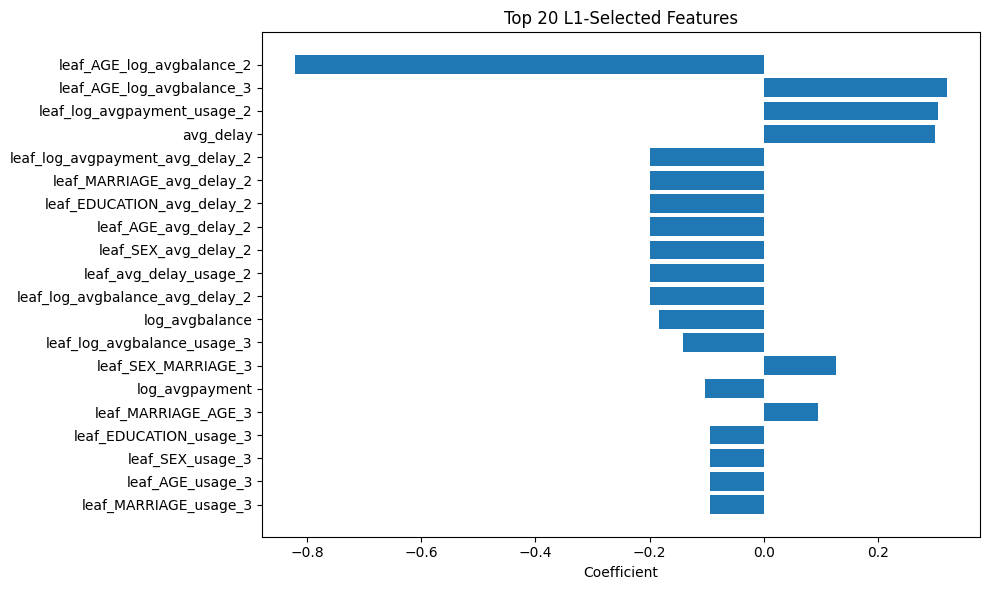

In [ ]:
# Extract coefficients and feature names
coefs = model.coef_[0]
features = X_final_test.columns

# Create a DataFrame
coef_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefs
})

#: Filter non-zero coefficients and sort by magnitude
coef_df = coef_df[coef_df['Coefficient'] != 0]
coef_df['Abs_Coefficient'] = coef_df['Coefficient'].abs()
coef_df = coef_df.sort_values(by='Abs_Coefficient', ascending=False)

# Display the top coefficients
print("\nTop non-zero coefficients:")
print(coef_df[['Feature', 'Coefficient']])

#visual for the chart
top_n = 64
top_features = coef_df.head(top_n)

plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Coefficient'])
plt.xlabel("Coefficient")
plt.title(f"Top {top_n} L1-Selected Features")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()